In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from PIL import Image, ImageDraw
import requests
from io import BytesIO
import os
import pandas as pd

from notebooks_util import * 

%matplotlib inline
%load_ext autoreload
%autoreload 2

Using TensorFlow backend.


# Loading Datasets

In [3]:
path = 'data/grass_images'
images = list()
images_2 = list()
for file in os.listdir(path):
    img = Image.open(os.path.join(path, file))
    img = img.resize((224, 224))
    images.append(img)
    
    img_2 = img.copy()
    draw = ImageDraw.Draw(img_2)
    draw.ellipse((30, 30, 80, 80), fill='brown')
    images_2.append(img_2)
    
def prep(img):
    x = preprocessing.image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

img_array = np.concatenate([prep(img) for img in images])
img_array_2 = np.concatenate([prep(img) for img in images_2])

In [4]:
print(img_array.shape)
print(img_array_2.shape)

(92, 224, 224, 3)
(92, 224, 224, 3)


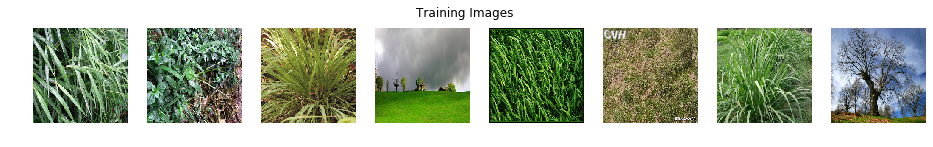

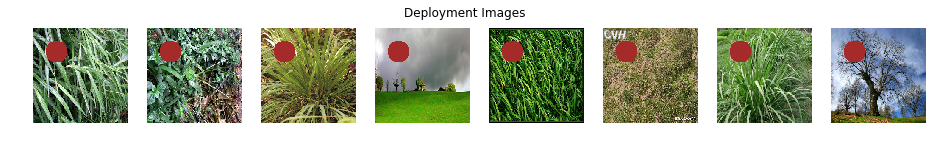

In [5]:
n_show = 8

# Show some examples.
_, ax = plt.subplots(1,n_show, figsize=[16, 2])
plt.suptitle('Training Images')
for i in range(n_show):
    ax[i].imshow(images[i], cmap='gray')
    ax[i].set_axis_off()
    
_, ax = plt.subplots(1,n_show, figsize=[16, 2])
plt.suptitle('Deployment Images')
for i in range(n_show):
    ax[i].imshow(images_2[i], cmap='gray')
    ax[i].set_axis_off()

# Get All Mean Activations

In [6]:
# build the VGG16 network with ImageNet weights
vgg = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')
vgg.summary()

Instructions for updating:
Colocations handled automatically by placer.
Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
________________________________________________________

In [7]:
LAYERS = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
mean_activations_all_layers = []
for layer in LAYERS:
    mean_activations = get_mean_activation_of_layer(vgg, layer, img_array)
    mean_activations_all_layers.append(mean_activations)
    
mean_activations_all_layers_2 = []
for layer in LAYERS:
    mean_activations_2 = get_mean_activation_of_layer(vgg, layer, img_array_2)
    mean_activations_all_layers_2.append(mean_activations_2)

Compute filters 0 to 64
Compute filters 0 to 128
Compute filters 0 to 256
Compute filters 0 to 512
Compute filters 0 to 512
Compute filters 0 to 64
Compute filters 0 to 128
Compute filters 0 to 256
Compute filters 0 to 512
Compute filters 0 to 512


In [9]:
activations1 = np.concatenate(mean_activations_all_layers, axis=0)
activations2 = np.concatenate(mean_activations_all_layers_2, axis=0)

# Differences

In [10]:
def compare_z_scores(arr1, arr2):
    arr_all = np.concatenate((arr1, arr2), axis=1)
    z_diff = (np.mean(arr2, axis=1) - np.mean(arr1, axis=1))/np.std(arr_all, axis=1)
    return z_diff

#### Within Population

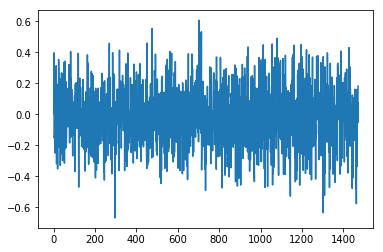

In [12]:
z_diff = compare_z_scores(activations1[:, :46], activations1[:, 46:])
plt.plot(z_diff)

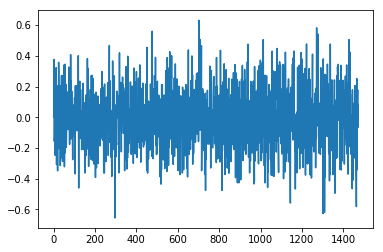

In [13]:
z_diff = compare_z_scores(activations2[:, :46], activations2[:, 46:])
plt.plot(z_diff)

#### Between Training and Deployment 

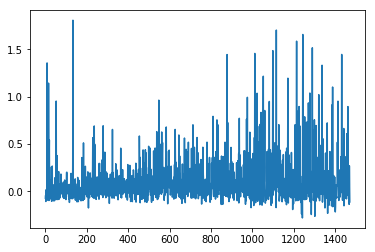

In [14]:
z_diff = compare_z_scores(activations1, activations2)
plt.plot(z_diff)

# Visualize _Those_ Filters

In [24]:
FILTER_COUNTS = [64, 128, 256, 512, 512]

def get_filter_name_and_index(diff, top_k=5):
    top_indices = np.argsort(diff)[::-1]
    top_k_indices = top_indices[:top_k]
    filter_names = []
    filter_indices = []
    for idx in top_k_indices:
        for j, fc in enumerate(FILTER_COUNTS):
            if idx > fc:
                idx -= fc
            else:
                filter_names.append(LAYERS[j])
                filter_indices.append(idx)
                break
                
    return filter_names, filter_indices

In [26]:
filter_names, filter_indices = get_filter_name_and_index(z_diff, top_k=20)

In [27]:
filter_names, filter_indices

(['block2_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block4_conv1',
  'block1_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block1_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1',
  'block5_conv1'],
 [69,
  156,
  284,
  254,
  330,
  139,
  52,
  472,
  430,
  8,
  377,
  93,
  212,
  15,
  428,
  318,
  63,
  361,
  57,
  16])

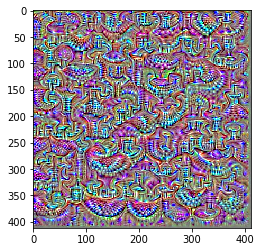

In [74]:
plt.imshow(img)

In [82]:
for fn, fi in zip(filter_names, filter_indices):
    print(fn, fi)

block2_conv1 69
block5_conv1 156
block5_conv1 284
block5_conv1 254
block5_conv1 330
block5_conv1 139
block5_conv1 52
block5_conv1 472
block4_conv1 430
block1_conv1 8
block5_conv1 377
block5_conv1 93
block5_conv1 212
block1_conv1 15
block5_conv1 428
block5_conv1 318
block5_conv1 63
block5_conv1 361
block5_conv1 57
block5_conv1 16


0 filter processed.
0 filter processed.
0 filter processed.
0 filter processed.
0 filter processed.
Costs of filter 139:   384 ( 143.50s )
1 filter processed.
Costs of filter  52:   630 ( 251.00s )
1 filter processed.
Costs of filter 472:   840 ( 216.48s )
1 filter processed.
Costs of filter 430:  1964 ( 136.61s )
1 filter processed.
Costs of filter   8:    81 ( 6.44s )
1 filter processed.
Costs of filter 377:   660 ( 188.82s )
1 filter processed.
0 filter processed.
Costs of filter 212:   352 ( 193.60s )
1 filter processed.
Costs of filter  15:    60 ( 8.11s )
1 filter processed.
Costs of filter 428:   733 ( 197.79s )
1 filter processed.
0 filter processed.
0 filter processed.
Costs of filter 361:   520 ( 185.82s )
1 filter processed.
0 filter processed.
0 filter processed.


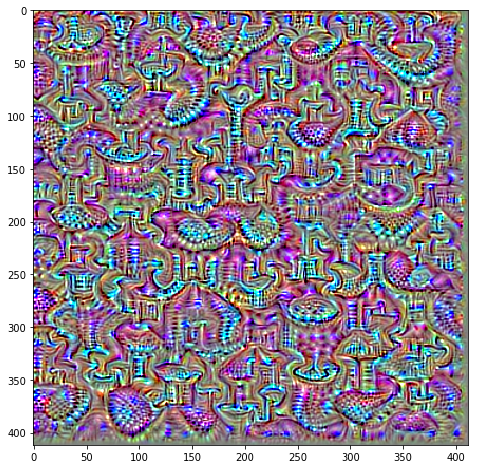

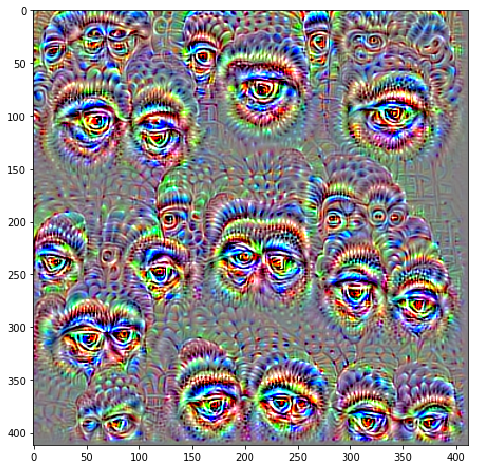

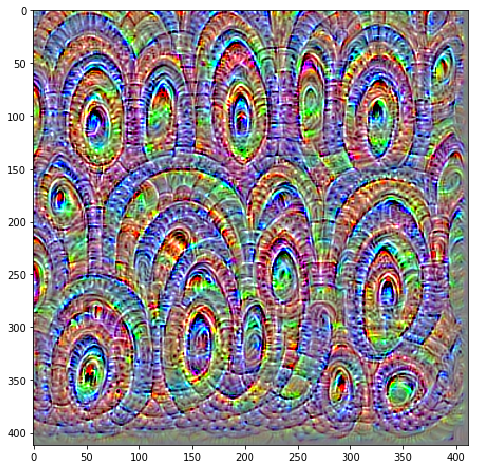

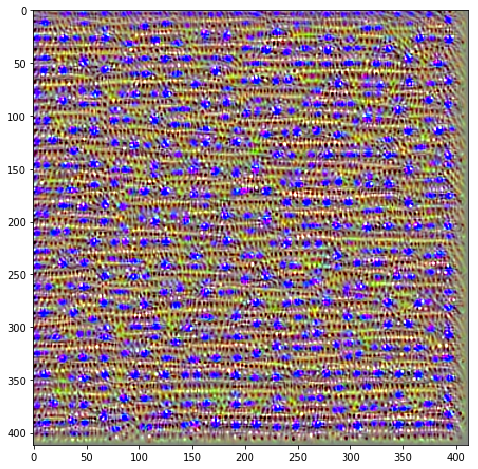

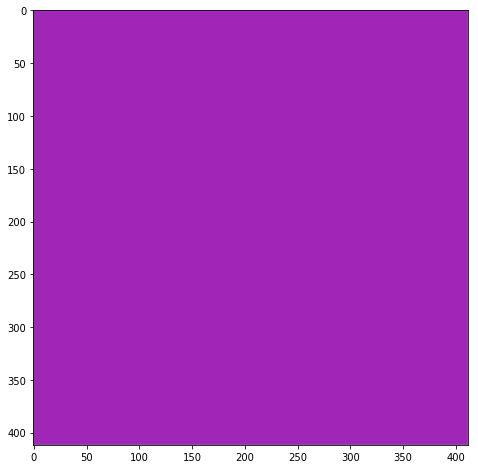

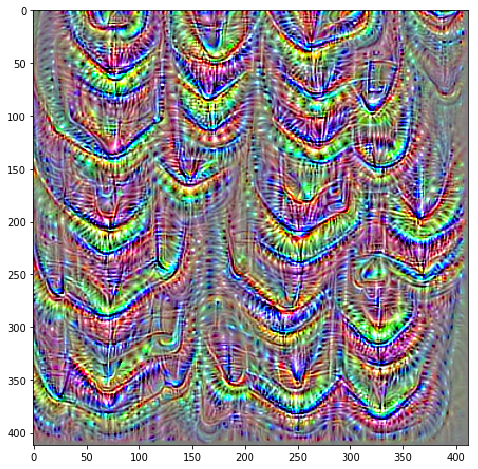

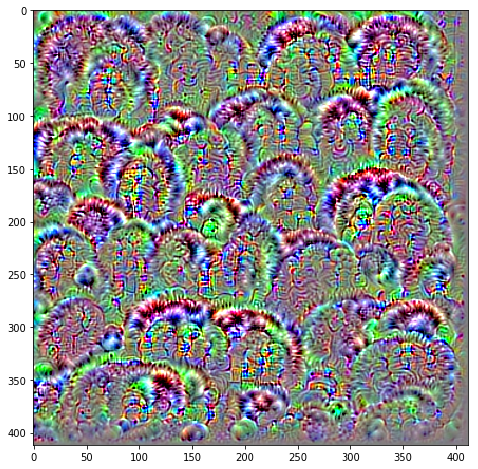

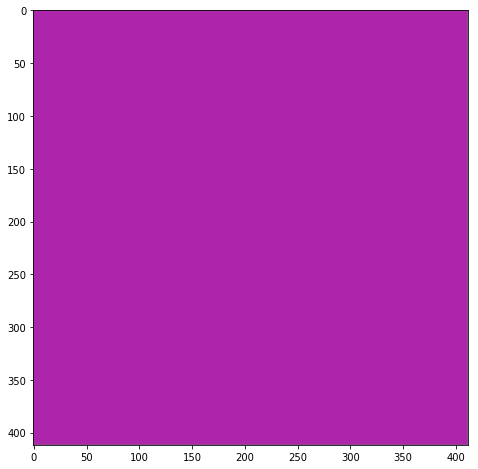

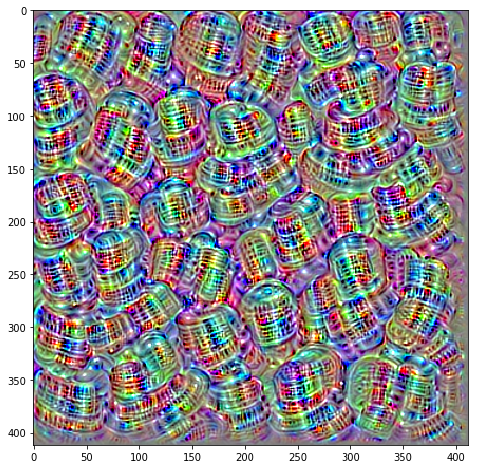

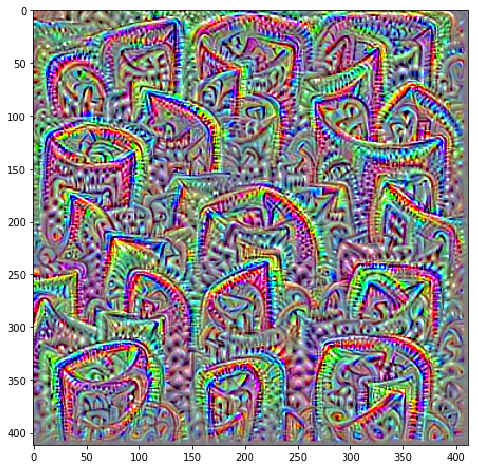

In [75]:
for fn, fi in zip(filter_names, filter_indices):
    img = visualize_layer(vgg, fn, filter_list=[fi])
    if img is not None:
        plt.figure(figsize=[8, 8])
        plt.imshow(img)

# Negative Control (random filters)

Costs of filter  63:   145 ( 49.42s )
1 filter processed.
Costs of filter  84:   531 ( 181.42s )
1 filter processed.
0 filter processed.
Costs of filter  62:   639 ( 190.32s )
1 filter processed.
0 filter processed.


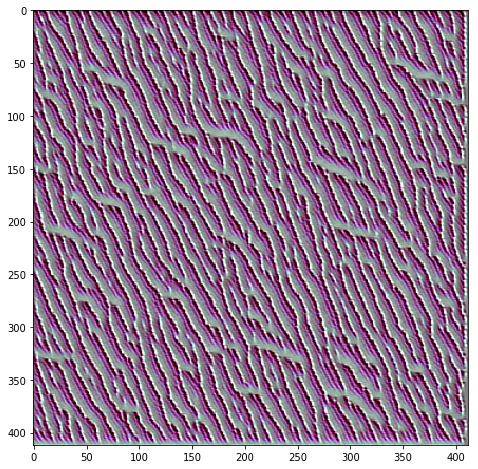

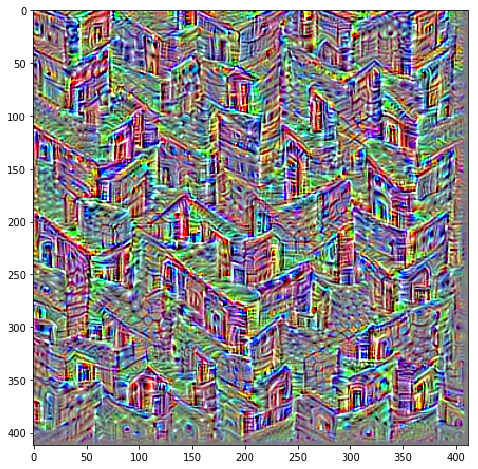

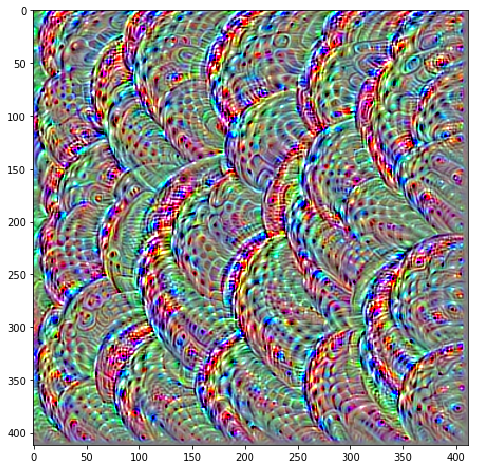

In [81]:
for fn, fi in zip(filter_names[:5], filter_indices[:5]):
    img = visualize_layer(vgg, fn, filter_list=[np.random.randint(1,100)])
    if img is not None:
        plt.figure(figsize=[8, 8])
        plt.imshow(img)

# Starting from a Template

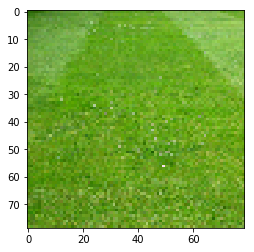

In [31]:
path = 'data/grass_new.jpg'
template_img = Image.open(path)
template_img = template_img.resize((79, 79))
    
def prep(img):
    x = preprocessing.image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

template_img_array = prep(template_img)
plt.imshow(template_img)

Costs of filter 430:     8 ( 7.36s )
1 filter processed.


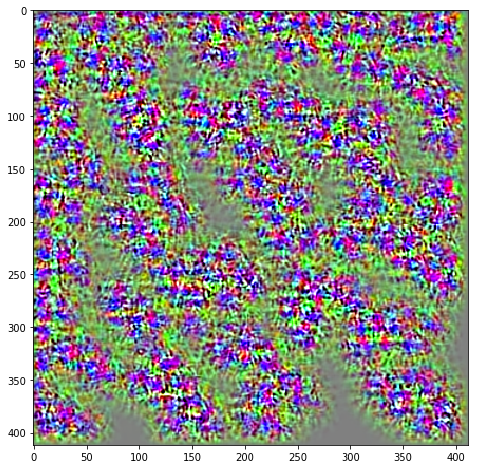

In [36]:
for fn, fi in zip(filter_names[8:9], filter_indices[8:9]):
    img = visualize_layer(vgg, fn, filter_list=[fi], template=template_img_array, epochs=1)
    if img is not None:
        plt.figure(figsize=[8, 8])
        plt.imshow(img)

Costs of filter  69:    12 ( 6.66s )
1 filter processed.
Costs of filter 156:     1 ( 18.16s )
1 filter processed.
0 filter processed.
0 filter processed.
0 filter processed.
Costs of filter 139:     1 ( 18.26s )
1 filter processed.
0 filter processed.
0 filter processed.
Costs of filter 430:    47 ( 14.81s )
1 filter processed.
Costs of filter   8:     8 ( 1.56s )
1 filter processed.


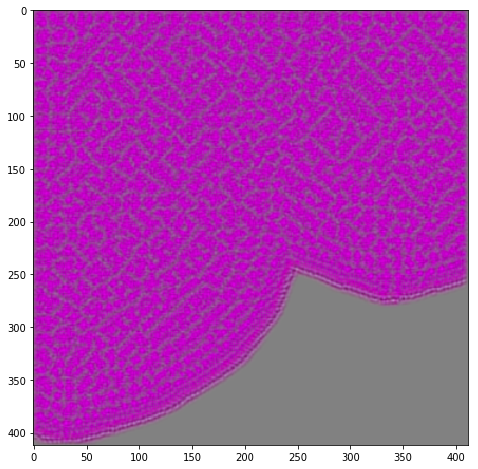

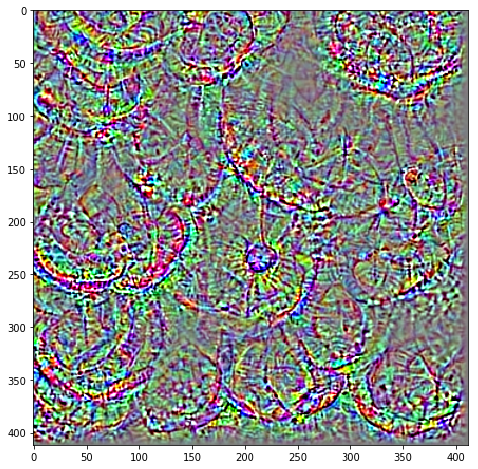

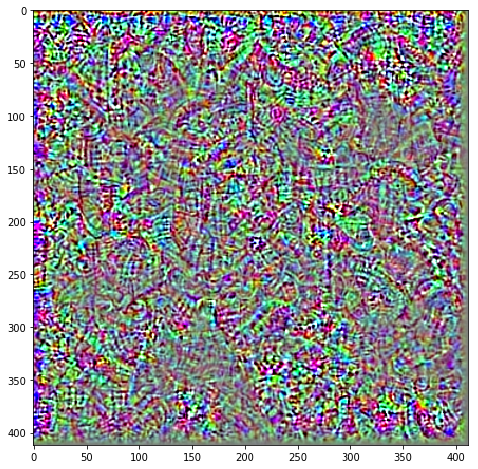

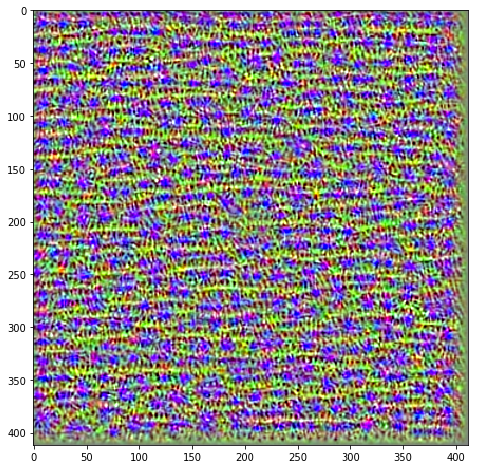

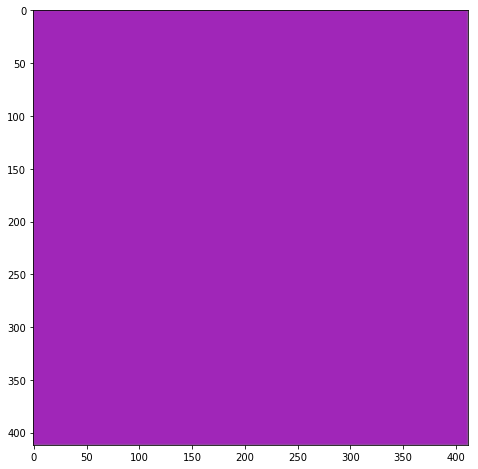

In [38]:
for fn, fi in zip(filter_names[:10], filter_indices[:10]):
    img = visualize_layer(vgg, fn, filter_list=[fi], template=template_img_array, epochs=2)
    if img is not None:
        plt.figure(figsize=[8, 8])
        plt.imshow(img)